# **Proyecto 2 - Supervised Machine Learning - MÁSTER EN DATA SCIENCE & AI : NUCLIO**

## Librerias

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import set_config
set_config(transform_output="pandas")

#Entrenamiento del modelo
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV


# transformers
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, MinMaxScaler, FunctionTransformer, OrdinalEncoder

# pipelines
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Model evaluation
import sklearn.metrics as metrics

# model selection e hiperparameters optimization
from sklearn import model_selection

## Funciones

In [3]:
def toInt(series: pd.Series) -> pd.Series:
    return series.astype(int)

In [4]:
def replaceDot(series: pd.Series) -> pd.Series:
    return series.str.replace('.','')

## Data preparation

In [7]:
# sincronizamos drive
#from google.colab import drive
#drive.mount('/content/drive')

In [5]:
#df = pd.read_csv('/content/drive/MyDrive/MASTER/TFM/Entregable 2/sample_mmp.csv')
df = pd.read_csv('sample_mmp.csv')

C:\Users\Xesco\AppData\Local\Temp\ipykernel_20528\4259086002.py:2: DtypeWarning: Columns (29,42) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('sample_mmp.csv')


In [6]:
# Mostrar todas las columnas del dataframe
pd.set_option('display.max_columns', None)
#pd.reset_option('display.max_columns')


In [7]:
df

,Unnamed: 0,MachineIdentifier,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,AVProductStatesIdentifier,AVProductsInstalled,AVProductsEnabled,HasTpm,CountryIdentifier,CityIdentifier,OrganizationIdentifier,GeoNameIdentifier,LocaleEnglishNameIdentifier,Platform,Processor,OsVer,OsBuild,OsSuite,OsPlatformSubRelease,OsBuildLab,SkuEdition,IsProtected,AutoSampleOptIn,PuaMode,SMode,IeVerIdentifier,SmartScreen,Firewall,UacLuaenable,Census_MDC2FormFactor,Census_DeviceFamily,Census_OEMNameIdentifier,Census_OEMModelIdentifier,Census_ProcessorCoreCount,Census_ProcessorManufacturerIdentifier,Census_ProcessorModelIdentifier,Census_ProcessorClass,Census_PrimaryDiskTotalCapacity,Census_PrimaryDiskTypeName,Census_SystemVolumeTotalCapacity,Census_HasOpticalDiskDrive,Census_TotalPhysicalRAM,Census_ChassisTypeName,Census_InternalPrimaryDiagonalDisplaySizeInInches,Census_InternalPrimaryDisplayResolutionHorizontal,Census_InternalPrimaryDisplayResolutionVertical,Census_PowerPlatformRoleName,Census_InternalBatteryType,Census_InternalBatteryNumberOfCharges,Census_OSVersion,Census_OSArchitecture,Census_OSBranch,Census_OSBuildNumber,Census_OSBuildRevision,Census_OSEdition,Census_OSSkuName,Census_OSInstallTypeName,Census_OSInstallLanguageIdentifier,Census_OSUILocaleIdentifier,Census_OSWUAutoUpdateOptionsName,Census_IsPortableOperatingSystem,Census_GenuineStateName,Census_ActivationChannel,Census_IsFlightingInternal,Census_IsFlightsDisabled,Census_FlightRing,Census_ThresholdOptIn,Census_FirmwareManufacturerIdentifier,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections
0,8427007,f1cd864e97bae82bdf96523e1a539121,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1234.0,0,7.0,0,NaN,53447.0,1.0,1.0,1,8,85219.0,NaN,205.0,172,windows10,x64,10.0.0.0,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,1.0,0,NaN,0.0,137.0,RequireAdmin,1.0,1.0,Desktop,Windows.Desktop,1443.0,275891.0,4.0,5.0,2273.0,NaN,953869.0,HDD,952838.0,0,8192.0,AllinOne,23.0,1920.0,1080.0,Desktop,NaN,4.294967e+09,10.0.17134.165,amd64,rs4_release,17134,165,Professional,PROFESSIONAL,UUPUpgrade,27.0,120,FullAuto,0,IS_GENUINE,OEM:DM,NaN,0.0,Retail,NaN,355.0,19951.0,0,NaN,0.0,0,0,0.0,0.0,11.0,1
1,8829090,fd5ba6f5b75325ec0423a6c67cc75942,win8defender,1.1.15100.1,4.18.1807.18075,1.273.1282.0,0,7.0,0,NaN,53447.0,1.0,1.0,1,129,54198.0,NaN,126.0,124,windows10,x64,10.0.0.0,17134,256,rs4,17134.1.amd64fre.rs4_release.180410-1804,Pro,1.0,0,NaN,0.0,137.0,RequireAdmin,1.0,1.0,Notebook,Windows.Desktop,2102.0,248850.0,4.0,5.0,2660.0,NaN,476940.0,HDD,457600.0,0,8192.0,Notebook,13.2,1280.0,720.0,Mobile,lion,0.000000e+00,10.0.17134.165,amd64,rs4_release,17134,165,Professional,PROFESSIONAL,UUPUpgrade,18.0,72,FullAuto,0,IS_GENUINE,OEM:DM,NaN,0.0,Retail,0.0,486.0,48753.0,0,0.0,0.0,0,0,0.0,1.0,3.0,0
2,2731904,4e628391e7cc7c482fb3286f486dbd25,win8defender,1.1.15100.1,4.9.10586.1106,1.273.781.0,0,7.0,0,NaN,46781.0,2.0,1.0,1,149,122689.0,27.0,181.0,56,windows10,x64,10.0.0.0,10586,768,th2,10586.1176.amd64fre.th2_release_sec.170913-1848,Home,1.0,0,NaN,0.0,74.0,RequireAdmin,1.0,1.0,Convertible,Windows.Desktop,2206.0,238234.0,4.0,5.0,2998.0,NaN,244198.0,SSD,221251.0,0,8192.0,Notebook,15.5,1920.0,1080.0,Mobile,lion,0.000000e+00,10.0.10586.1176,amd64,th2_release_sec,10586,1176,Core,CORE,Update,24.0,109,Notify,0,IS_GENUINE,Retail,NaN,0.0,Retail,0.0,554.0,33111.0,1,0.0,0.0,1,1,0.0,0.0,15.0,0
3,1359513,270a2e9d028144a4df12a9e3da79fba5,win8defender,1.1.15200.1,4.18.1807.18075,1.275.1639.0,0,7.0,0,NaN,53447.0,1.0,1.0,1,164,114587.0,27.0,205.0,172,windows10,x64,10.0.0.0,17134,768,rs4,17134.1.amd64fre.rs4_release.180410-1804,Home,1.0,0,NaN,0.0,137.0,NaN,1.0,1.0,Notebook,Windows.Desktop,525.0,265410.0,8.0,5.0,2880.0,NaN,228936.0,SSD,228321.0,0,8192.0,Notebook,15.5,1920.0,1080.0,Mobil

In [8]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 84 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   Unnamed: 0                                         500000 non-null  int64  
 1   MachineIdentifier                                  500000 non-null  object 
 2   ProductName                                        500000 non-null  object 
 3   EngineVersion                                      500000 non-null  object 
 4   AppVersion                                         500000 non-null  object 
 5   AvSigVersion                                       500000 non-null  object 
 6   IsBeta                                             500000 non-null  int64  
 7   RtpStateBitfield                                   498168 non-null  float64
 8   IsSxsPassiveMode                                   500000 non-null  int64 

Procederemos a colocar MachineIdentifier como índice, ya que es una variable que per se no aporta ningún valor, pero como índice sí.

In [9]:
df.set_index('MachineIdentifier', inplace=True)

Identificando ya el target ('HasDetections') y guardándolo en la variable Y. Del mismo modo, eliminamos el target de nuestro dataset sobre el que aplicaremos el modelo.

In [10]:
Y = df['HasDetections']
X = df.drop('HasDetections', axis=1)

### Duplicados

Comprobamos si hay o no duplicados en nuestro dataset.

In [14]:
df[df.duplicated(keep=False)]

,Unnamed: 0,ProductName,EngineVersion,AppVersion,AvSigVersion,IsBeta,RtpStateBitfield,IsSxsPassiveMode,DefaultBrowsersIdentifier,AVProductStatesIdentifier,AVProductsInstalled,AVProductsEnabled,HasTpm,CountryIdentifier,CityIdentifier,OrganizationIdentifier,GeoNameIdentifier,LocaleEnglishNameIdentifier,Platform,Processor,OsVer,OsBuild,OsSuite,OsPlatformSubRelease,OsBuildLab,SkuEdition,IsProtected,AutoSampleOptIn,PuaMode,SMode,IeVerIdentifier,SmartScreen,Firewall,UacLuaenable,Census_MDC2FormFactor,Census_DeviceFamily,Census_OEMNameIdentifier,Census_OEMModelIdentifier,Census_ProcessorCoreCount,Census_ProcessorManufacturerIdentifier,Census_ProcessorModelIdentifier,Census_ProcessorClass,Census_PrimaryDiskTotalCapacity,Census_PrimaryDiskTypeName,Census_SystemVolumeTotalCapacity,Census_HasOpticalDiskDrive,Census_TotalPhysicalRAM,Census_ChassisTypeName,Census_InternalPrimaryDiagonalDisplaySizeInInches,Census_InternalPrimaryDisplayResolutionHorizontal,Census_InternalPrimaryDisplayResolutionVertical,Census_PowerPlatformRoleName,Census_InternalBatteryType,Census_InternalBatteryNumberOfCharges,Census_OSVersion,Census_OSArchitecture,Census_OSBranch,Census_OSBuildNumber,Census_OSBuildRevision,Census_OSEdition,Census_OSSkuName,Census_OSInstallTypeName,Census_OSInstallLanguageIdentifier,Census_OSUILocaleIdentifier,Census_OSWUAutoUpdateOptionsName,Census_IsPortableOperatingSystem,Census_GenuineStateName,Census_ActivationChannel,Census_IsFlightingInternal,Census_IsFlightsDisabled,Census_FlightRing,Census_ThresholdOptIn,Census_FirmwareManufacturerIdentifier,Census_FirmwareVersionIdentifier,Census_IsSecureBootEnabled,Census_IsWIMBootEnabled,Census_IsVirtualDevice,Census_IsTouchEnabled,Census_IsPenCapable,Census_IsAlwaysOnAlwaysConnectedCapable,Wdft_IsGamer,Wdft_RegionIdentifier,HasDetections
MachineIdentifier,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


### Variables

Vamos a ver los valores únicos de las mismas iterando sobre el df, mostrando el tipo de variable que es

In [15]:
for i in df.columns:
    print(f'\n {i} | Tipo: {df[i].dtype}\n {df[i].unique()}')


 Unnamed: 0 | Tipo: int64
 [8427007 8829090 2731904 ... 8819786 8713685 4295573]

 ProductName | Tipo: object
 ['win8defender' 'mse' 'mseprerelease']

 EngineVersion | Tipo: object
 ['1.1.15100.1' '1.1.15200.1' '1.1.14600.4' '1.1.15000.2' '1.1.15300.6'
 '1.1.13202.0' '1.1.14800.3' '1.1.15300.5' '1.1.14104.0' '1.1.14901.4'
 '1.1.14405.2' '1.1.14306.0' '1.1.14500.5' '1.1.13504.0' '1.1.14901.3'
 '1.1.14201.0' '1.1.14700.5' '1.1.14305.0' '1.1.14003.0' '1.1.13601.0'
 '1.1.13000.0' '1.1.13804.0' '1.1.14202.0' '1.1.12902.0' '1.1.13303.0'
 '1.1.15000.1' '1.1.13103.0' '1.1.13903.0' '1.1.13704.0' '1.1.13407.0'
 '1.1.13701.0' '1.1.12805.0' '1.1.14700.3' '1.1.14800.1' '1.1.14700.4'
 '1.1.12101.0' '1.1.14103.0' '1.1.12400.0' '1.1.14002.0' '1.1.12603.0'
 '1.1.14500.2' '1.1.14001.0' '1.1.12804.0' '1.1.13803.0' '1.1.13902.0'
 '1.1.14303.0' '1.1.13406.0' '1.1.11701.0' '1.1.13802.0' '1.1.12706.0'
 '1.1.13102.0' '1.1.10401.0' '1.1.14102.0']

 AppVersion | Tipo: object
 ['4.18.1807.18075' '4.9.10586.1106

Debemos ahondar en el análisis de cada variable y, de cara a comenzar con el tratamiento de las mismas, vamos a identificar qué peso tiene cada valor único, incluyendo los valores nulos

In [16]:
for i in df.columns: # Loop en las columnas del df
  print('\n',i,df[i].value_counts(normalize=True, dropna=False)*100,'\n') # Print del número de veces que aparece cada valor distinto de la columna


 Unnamed: 0 Unnamed: 0
8427007    0.0002
4076126    0.0002
7315011    0.0002
7257590    0.0002
4851285    0.0002
            ...  
3391674    0.0002
6246089    0.0002
42434      0.0002
7181890    0.0002
4295573    0.0002
Name: proportion, Length: 500000, dtype: float64 


 ProductName ProductName
win8defender     98.9208
mse               1.0790
mseprerelease     0.0002
Name: proportion, dtype: float64 


 EngineVersion EngineVersion
1.1.15200.1    43.2982
1.1.15100.1    41.0988
1.1.15000.2     2.9504
1.1.14901.4     2.3968
1.1.14600.4     1.8010
1.1.14800.3     1.5096
1.1.15300.6     1.3538
1.1.14104.0     1.0480
1.1.15300.5     0.7766
1.1.13504.0     0.7752
1.1.14700.5     0.5186
1.1.14500.5     0.5182
1.1.14405.2     0.3944
1.1.14306.0     0.2658
1.1.14202.0     0.1680
1.1.14003.0     0.1608
1.1.13303.0     0.1032
1.1.13903.0     0.1030
1.1.13804.0     0.1026
1.1.13407.0     0.0958
1.1.13601.0     0.0840
1.1.12902.0     0.0642
1.1.14305.0     0.0540
1.1.13701.0     0.0510
1.1.13704

### Eliminacion de variables

Eliminaremos las siguientes variables:
* AutoSampleOptIn: todos los valores son 'no'
* Census_IsFlightingInternal: el 83% de los valores son NaN
* Census_IsFlightsDisabled: todos los valores son 0
* Census_IsWIMBootEnabled: la mayoría de los valores son NaN
* Census_ProcessorClass: el 99% de los valores son nulos y es una información que no se actualiza
* Census_ThresholdOptIn: la mayoría de los valores son NaN
* DefaultBrowsersIdentifier: la mayoría de los valores son NaN
* PuaMode: casi el 100% de los valores son NaN
* Unnamed 0: no aporta ninguna información
* Identificadores: AVProductStatesIdentifier, CountryIdentifier, CityIdentifier, OrganizationIdentifier, GeoNameIdentifier, LocaleEnglishNameIdentifier, IeVerIdentifier, Census_OEMNameIdentifier, Census_OEMModelIdentifier, Census_ProcessorManufacturerIdentifier, Census_ProcessorModelIdentifier, Census_OSInstallLanguageIdentifier, Census_OSUILocaleIdentifier, Census_FirmwareManufacturerIdentifier, Census_FirmwareVersionIdentifier, Wdft_RegionIdentifier
* Census_InternalPrimaryDiagonalDisplaySizeInInches: irrelevante (Retrieves the physical diagonal length in inches of the primary display)
* Census_InternalPrimaryDisplayResolutionHorizontal: irrelevante (Retrieves the number of pixels in the horizontal direction of the internal display)
* Census_InternalPrimaryDisplayResolutionVertical: irrelevante (Retrieves the number of pixels in the vertical direction of the internal display)
* MachineIdentifier
* Census_ChassisTypeName: informacion redundante
* Census_InternalBatteryType: 70% de nulos

In [11]:
df1 = X.copy()
df1.drop(['AutoSampleOptIn', 
          'Census_IsFlightingInternal', 
          'Census_IsFlightsDisabled',
          'Census_IsWIMBootEnabled', 
          'Census_ProcessorClass', 
          'Census_ThresholdOptIn',
          'DefaultBrowsersIdentifier', 
          'PuaMode', 
          'Unnamed: 0' , 
          'AVProductStatesIdentifier',
          'CountryIdentifier', 
          'CityIdentifier', 
          'OrganizationIdentifier', 
          'GeoNameIdentifier',
          'LocaleEnglishNameIdentifier', 
          'IeVerIdentifier', 
          'Census_OEMNameIdentifier',
          'Census_OEMModelIdentifier', 
          'Census_ProcessorManufacturerIdentifier',
          'Census_ProcessorModelIdentifier', 
          'Census_OSInstallLanguageIdentifier',
          'Census_OSUILocaleIdentifier', 
          'Census_FirmwareManufacturerIdentifier',
          'Census_FirmwareVersionIdentifier', 
          'Wdft_RegionIdentifier',
          'Census_InternalPrimaryDiagonalDisplaySizeInInches',
          'Census_InternalPrimaryDisplayResolutionHorizontal',
          'Census_InternalPrimaryDisplayResolutionVertical',
          #'MachineIdentifier', 
          'Census_ChassisTypeName',
          'Census_InternalBatteryType'],
         axis=1, inplace=True)

### Transformación de variables

#### Versions

Cuanto más reciente es una versión, mayor es el número de la misma. Esto hace que sea conveniente cambiar el tipo de estas variables a enteras, así como hacer un Ordinal Encoding para ordenarlas de más antiguas a más recientes
* EngineVersion
* AppVersion
* AvSigVersion
* Census_OSVersion
* OsVer

In [12]:
df1['EngineVersion'].unique()

array(['1.1.15100.1', '1.1.15200.1', '1.1.14600.4', '1.1.15000.2',
       '1.1.15300.6', '1.1.13202.0', '1.1.14800.3', '1.1.15300.5',
       '1.1.14104.0', '1.1.14901.4', '1.1.14405.2', '1.1.14306.0',
       '1.1.14500.5', '1.1.13504.0', '1.1.14901.3', '1.1.14201.0',
       '1.1.14700.5', '1.1.14305.0', '1.1.14003.0', '1.1.13601.0',
       '1.1.13000.0', '1.1.13804.0', '1.1.14202.0', '1.1.12902.0',
       '1.1.13303.0', '1.1.15000.1', '1.1.13103.0', '1.1.13903.0',
       '1.1.13704.0', '1.1.13407.0', '1.1.13701.0', '1.1.12805.0',
       '1.1.14700.3', '1.1.14800.1', '1.1.14700.4', '1.1.12101.0',
       '1.1.14103.0', '1.1.12400.0', '1.1.14002.0', '1.1.12603.0',
       '1.1.14500.2', '1.1.14001.0', '1.1.12804.0', '1.1.13803.0',
       '1.1.13902.0', '1.1.14303.0', '1.1.13406.0', '1.1.11701.0',
       '1.1.13802.0', '1.1.12706.0', '1.1.13102.0', '1.1.10401.0',
       '1.1.14102.0'], dtype=object)

In [13]:
df2 = df1.copy()
df2['EngineVersion'] = replaceDot(df2['EngineVersion'])
df2['EngineVersion'] = OrdinalEncoder().fit_transform(df2[['EngineVersion']])
df2['EngineVersion'] = toInt(df2['EngineVersion'])
df2['EngineVersion'].unique()

array([49, 50, 39, 48, 52, 12, 44, 51, 30, 46, 36, 35, 38, 16, 45, 31, 42,
       34, 27, 17,  9, 22, 32,  8, 13, 47, 11, 24, 19, 15, 18,  7, 40, 43,
       41,  2, 29,  3, 26,  4, 37, 25,  6, 21, 23, 33, 14,  1, 20,  5, 10,
        0, 28])

In [14]:
df2['AppVersion'] = replaceDot(df2['AppVersion'])
df2['AppVersion'] = OrdinalEncoder().fit_transform(df2[['AppVersion']])
df2['AppVersion'] = toInt(df2['AppVersion'])
df2['AppVersion'].unique()

array([51, 83, 46, 68, 27, 19, 34, 81, 23, 59, 13,  0, 24, 22, 40,  5, 26,
       16, 90, 10, 21, 92, 87, 33, 64, 17, 25, 88, 14, 82,  6, 53, 67, 75,
       11,  4,  2, 94, 86, 32, 80,  8, 76, 89, 93,  1, 12, 91, 57, 78, 56,
       60, 65, 58, 63, 36, 74, 62, 73, 79, 28,  7, 55, 45, 61, 66, 54, 77,
       50, 52, 71, 18, 20, 15, 48,  3, 41, 37, 39, 70, 31, 47, 42, 38, 43,
       69, 85,  9, 44, 84, 35, 30, 72, 29, 49])

In [15]:
df2['AvSigVersion'] = replaceDot(df2['AvSigVersion'])
df2['AvSigVersion'] = OrdinalEncoder().fit_transform(df1[['AvSigVersion']])
df2['AvSigVersion'] = toInt(df2['AvSigVersion'])
df2['AvSigVersion'].unique()

array([5557, 5576, 5898, ...,  748, 2106, 1067])

In [16]:
df2['Census_OSVersion'] = replaceDot(df2['Census_OSVersion'])
df2['Census_OSVersion'] = OrdinalEncoder().fit_transform(df2[['Census_OSVersion']])
df2['Census_OSVersion'] = toInt(df2['Census_OSVersion'])
df2['Census_OSVersion'].unique()

array([250,  60, 257, 253, 235, 179, 169, 176,  35,  52, 225, 261, 227,
       230, 252, 232, 256, 251, 248, 182, 223, 249, 220, 217, 125,  64,
       222, 174, 214, 152,  17, 104,  95, 197, 120, 241, 254, 237, 221,
       259, 110, 247,   7, 258, 144, 206, 155,  58, 215, 148, 236,  54,
        77,   0, 194,  69,  89, 153, 201, 233,  80, 208, 126,  91,  78,
       203,  31,  25,  82, 129,  72, 204, 187, 216, 122,  71,  55, 166,
       234,  73, 167,  81, 283, 196, 296, 277,  34,  19,  47, 199, 238,
       156, 117,  75,  99, 135, 100, 190,  65, 192, 115, 228, 102, 195,
        66, 113, 142, 127,  68, 231, 131,   8, 107, 133, 116, 145,  98,
       175, 180, 177, 114, 178, 146,  85, 130, 202, 138,  48, 191, 137,
        57,  67,  13, 239, 184, 112, 157, 224,   2,  87, 139, 141, 188,
        53,  63,  14,  90, 143, 118, 205, 226, 288, 132,  51,  62, 198,
        15,  84,  50,  23, 140, 298, 134, 170,  26,  70, 171, 183,  83,
       240, 245, 285,  32, 105, 293,  29, 269, 260,   5,  46, 12

In [17]:
df2['OsVer'] = replaceDot(df2['OsVer'])
df2['OsVer'] = OrdinalEncoder().fit_transform(df2[['OsVer']])
df2['OsVer'] = toInt(df2['OsVer'])
df2['OsVer'].unique()

array([ 0, 15, 14, 13,  5,  2, 11,  8,  6,  3,  7, 12,  9,  4, 19, 16,  1,
       17, 18, 20, 10])

### Revision

In [18]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500000 entries, f1cd864e97bae82bdf96523e1a539121 to 7b45dc3537e17f16305c5983ca0a1cb9
Data columns (total 52 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   ProductName                              500000 non-null  object 
 1   EngineVersion                            500000 non-null  int32  
 2   AppVersion                               500000 non-null  int32  
 3   AvSigVersion                             500000 non-null  int32  
 4   IsBeta                                   500000 non-null  int64  
 5   RtpStateBitfield                         498168 non-null  float64
 6   IsSxsPassiveMode                         500000 non-null  int64  
 7   AVProductsInstalled                      498062 non-null  float64
 8   AVProductsEnabled                        498062 non-null  float64
 9   HasTpm                                   500000 non

Comprobación de variables númericas y categóricas

In [19]:
numeric_columns = df2.select_dtypes(include = np.number).columns.tolist()
object_columns = df2.select_dtypes(exclude = np.number).columns.tolist()

assert (len(numeric_columns) + len(object_columns)) == df2.shape[1], "Hay columnas sin asignar"

In [20]:
for i in numeric_columns:
    print(f'\n {i} | Tipo: {df2[i].dtype}\n {df2[i].unique()}')


 EngineVersion | Tipo: int32
 [49 50 39 48 52 12 44 51 30 46 36 35 38 16 45 31 42 34 27 17  9 22 32  8
 13 47 11 24 19 15 18  7 40 43 41  2 29  3 26  4 37 25  6 21 23 33 14  1
 20  5 10  0 28]

 AppVersion | Tipo: int32
 [51 83 46 68 27 19 34 81 23 59 13  0 24 22 40  5 26 16 90 10 21 92 87 33
 64 17 25 88 14 82  6 53 67 75 11  4  2 94 86 32 80  8 76 89 93  1 12 91
 57 78 56 60 65 58 63 36 74 62 73 79 28  7 55 45 61 66 54 77 50 52 71 18
 20 15 48  3 41 37 39 70 31 47 42 38 43 69 85  9 44 84 35 30 72 29 49]

 AvSigVersion | Tipo: int32
 [5557 5576 5898 ...  748 2106 1067]

 IsBeta | Tipo: int64
 [0 1]

 RtpStateBitfield | Tipo: float64
 [ 7.  0.  5. nan  8.  3.  1. 35.]

 IsSxsPassiveMode | Tipo: int64
 [0 1]

 AVProductsInstalled | Tipo: float64
 [ 1.  2.  3. nan  4.  5.]

 AVProductsEnabled | Tipo: float64
 [ 1.  2.  3.  0. nan  4.]

 HasTpm | Tipo: int64
 [1 0]

 OsVer | Tipo: int32
 [ 0 15 14 13  5  2 11  8  6  3  7 12  9  4 19 16  1 17 18 20 10]

 OsBuild | Tipo: int64
 [17134 1058

In [21]:
for i in object_columns:
    print(f'\n {i} | Tipo: {df2[i].dtype}\n {df2[i].unique()}')


 ProductName | Tipo: object
 ['win8defender' 'mse' 'mseprerelease']

 Platform | Tipo: object
 ['windows10' 'windows8' 'windows7' 'windows2016']

 Processor | Tipo: object
 ['x64' 'x86' 'arm64']

 OsPlatformSubRelease | Tipo: object
 ['rs4' 'th2' 'rs3' 'rs2' 'th1' 'rs1' 'windows8.1' 'windows7' 'prers5']

 OsBuildLab | Tipo: object
 ['17134.1.amd64fre.rs4_release.180410-1804'
 '10586.1176.amd64fre.th2_release_sec.170913-1848'
 '16299.431.amd64fre.rs3_release_svc_escrow.180502-1908'
 '15063.0.x86fre.rs2_release.170317-1834'
 '15063.0.amd64fre.rs2_release.170317-1834'
 '17134.1.x86fre.rs4_release.180410-1804'
 '10240.17443.amd64fre.th1.170602-2340'
 '16299.15.x86fre.rs3_release.170928-1534'
 '16299.15.amd64fre.rs3_release.170928-1534'
 '14393.2189.amd64fre.rs1_release.180329-1711'
 '10586.162.x86fre.th2_release_sec.160223-1728'
 '14393.693.amd64fre.rs1_release.161220-1747'
 '10240.16590.amd64fre.th1_st1.151104-1714'
 '9600.18821.amd64fre.winblue_ltsb.170914-0600'
 '14393.0.amd64fre.rs1_r

### Nulos

Calculamos el porcentaje de nulos de cada variable numérica

In [22]:
# Calcula el porcentaje de nulos de cada variable numerica
null_percentages = df2[numeric_columns].isnull().sum() / len(df2) * 100

for column, percentage in null_percentages.items():
    print(f"Column {column}: {percentage:.2f}% null values")

Column EngineVersion: 0.00% null values
Column AppVersion: 0.00% null values
Column AvSigVersion: 0.00% null values
Column IsBeta: 0.00% null values
Column RtpStateBitfield: 0.37% null values
Column IsSxsPassiveMode: 0.00% null values
Column AVProductsInstalled: 0.39% null values
Column AVProductsEnabled: 0.39% null values
Column HasTpm: 0.00% null values
Column OsVer: 0.00% null values
Column OsBuild: 0.00% null values
Column OsSuite: 0.00% null values
Column IsProtected: 0.39% null values
Column SMode: 5.97% null values
Column Firewall: 1.03% null values
Column UacLuaenable: 0.12% null values
Column Census_ProcessorCoreCount: 0.47% null values
Column Census_PrimaryDiskTotalCapacity: 0.60% null values
Column Census_SystemVolumeTotalCapacity: 0.60% null values
Column Census_HasOpticalDiskDrive: 0.00% null values
Column Census_TotalPhysicalRAM: 0.91% null values
Column Census_InternalBatteryNumberOfCharges: 3.01% null values
Column Census_OSVersion: 0.00% null values
Column Census_OSBui

Se puede observar valores muy bajos que no suponen más de un 6% del total

In [23]:
# Calcula el porcentaje de nulos de cada variable categórica
null_percentages1 = df2[object_columns].isnull().sum() / len(df2) * 100

for column, percentage in null_percentages1.items():
    print(f"Column {column}: {percentage:.2f}% null values")

Column ProductName: 0.00% null values
Column Platform: 0.00% null values
Column Processor: 0.00% null values
Column OsPlatformSubRelease: 0.00% null values
Column OsBuildLab: 0.00% null values
Column SkuEdition: 0.00% null values
Column SmartScreen: 35.72% null values
Column Census_MDC2FormFactor: 0.00% null values
Column Census_DeviceFamily: 0.00% null values
Column Census_PrimaryDiskTypeName: 0.14% null values
Column Census_PowerPlatformRoleName: 0.00% null values
Column Census_OSArchitecture: 0.00% null values
Column Census_OSBranch: 0.00% null values
Column Census_OSEdition: 0.00% null values
Column Census_OSSkuName: 0.00% null values
Column Census_OSInstallTypeName: 0.00% null values
Column Census_OSWUAutoUpdateOptionsName: 0.00% null values
Column Census_GenuineStateName: 0.00% null values
Column Census_ActivationChannel: 0.00% null values
Column Census_FlightRing: 0.00% null values


Llama la atención el 36% de nulos de 'SmartScreen' que procederemos a tratar más adelante

## Transformer

Definición de variables

In [29]:
numeric_columns = [
    'EngineVersion',
    'AppVersion',
    'AvSigVersion',
    'IsBeta',
    'RtpStateBitfield',
    'IsSxsPassiveMode',
    'AVProductsInstalled',
    'AVProductsEnabled',
    'HasTpm',
    'OsVer',
    'OsBuild',
    'OsSuite',
    'IsProtected',
    'SMode',
    'Firewall',
    'UacLuaenable',
    'Census_ProcessorCoreCount',
    'Census_PrimaryDiskTotalCapacity',
    'Census_SystemVolumeTotalCapacity',
    'Census_HasOpticalDiskDrive',
    'Census_TotalPhysicalRAM',
    'Census_InternalBatteryNumberOfCharges',
    'Census_OSVersion',
    'Census_OSBuildNumber',
    'Census_OSBuildRevision',
    'Census_IsPortableOperatingSystem',
    'Census_IsSecureBootEnabled',
    'Census_IsVirtualDevice',
    'Census_IsTouchEnabled',
    'Census_IsPenCapable',
    'Census_IsAlwaysOnAlwaysConnectedCapable',
    'Wdft_IsGamer',
    'OsBuildLab_1',
    'OsBuildLab_3_amd64fre',
    'OsBuildLab_2',
    'OsBuildLab_5']

object_columns = [
    'ProductName',
    'Platform',
    'Processor',
    'OsPlatformSubRelease',
    'SkuEdition',
    'SmartScreen',
    'Census_MDC2FormFactor',
    'Census_DeviceFamily',
    'Census_PrimaryDiskTypeName',
    'Census_PowerPlatformRoleName',
    'Census_OSArchitecture',
    'Census_OSBranch',
    'Census_OSEdition',
    'Census_OSSkuName',
    'Census_OSInstallTypeName',
    'Census_OSWUAutoUpdateOptionsName',
    'Census_GenuineStateName',
    'Census_ActivationChannel',
    'Census_FlightRing',
    'OsBuildLab_4']

### Funciones

Creamos unas funciones que modifiquen las variables y que, más adelante, encapsularemos en un FunctionTransformer.

In [30]:
def replaceDotDataframe(dataframe: pd.DataFrame, column_name: list ) -> pd.DataFrame:
    assert isinstance(column_name, list), "column_name is not a list"
    for i in column_name:
        dataframe[i] = replaceDot(dataframe[i])
    return dataframe

def toIntDataframe(dataframe: pd.DataFrame, column_name: list) -> pd.DataFrame:
    assert isinstance(column_name, list), "column_name is not a list"
    for i in column_name:
        dataframe[i] = dataframe[i].astype('int64')
    return dataframe

def imputeOther(dataframe: pd.DataFrame, column_name: list) -> pd.DataFrame:
    assert isinstance(column_name, list), "column_name is not a list"

    for i in column_name:
      value_counts = dataframe[i].value_counts(normalize=True)
      replace_values = value_counts[value_counts < 0.01].index
      dataframe[i] = dataframe[i].replace(replace_values, 'Other')

    return dataframe

def splitOsBuildLab(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe[['OsBuildLab_1', 'OsBuildLab_2', 'OsBuildLab_3', 'OsBuildLab_4', 'OsBuildLab_5']] = dataframe['OsBuildLab'].str.split('.', expand=True)

    return dataframe

Limpieza y tratamiento de variables

In [31]:
def cleanOsBuildLab(dataframe: pd.DataFrame) -> pd.DataFrame:
    #OsBuildLab_3
    dataframe['OsBuildLab_3'] = dataframe['OsBuildLab_3'].str.replace('arm64fre', 'amd64fre')
    dataframe['OsBuildLab_3'] = dataframe['OsBuildLab_3'].str.replace('amd64fre', '1')
    dataframe['OsBuildLab_3'] = dataframe['OsBuildLab_3'].str.replace('x86fre', '0')
    dataframe = dataframe.rename(columns={'OsBuildLab_3': 'OsBuildLab_3_amd64fre'})

    #OsBuildLab_5
    dataframe['OsBuildLab_5'] = dataframe['OsBuildLab_5'].str.replace('-', '')

    return dataframe

def cleanSmartScreen(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__SmartScreen'] = dataframe['impute_constant_UNKNOWN__SmartScreen'].str.replace('on', 'On')
    dataframe['impute_constant_UNKNOWN__SmartScreen'] = dataframe['impute_constant_UNKNOWN__SmartScreen'].str.replace('off', 'Off')

    return dataframe

def cleanCensus_PrimaryDiskTypeName(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_PrimaryDiskTypeName'] = dataframe['impute_constant_UNKNOWN__Census_PrimaryDiskTypeName'].str.replace('Unspecified', 'UNKNOWN')

    return dataframe

def cleanCensus_FlightRing(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_FlightRing'] = dataframe['impute_constant_UNKNOWN__Census_FlightRing'].str.replace('Unknown', 'UNKNOWN')

    return dataframe

def cleanUacLuaenable(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_mf__UacLuaenable'] = dataframe['impute_mf__UacLuaenable'].astype(int)
    dataframe.loc[dataframe['impute_mf__UacLuaenable'] > 1, 'impute_mf__UacLuaenable'] = 1

    return dataframe

def cleanProductName(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__ProductName'] = dataframe['impute_constant_UNKNOWN__ProductName'].str.replace('mseprerelease', 'mse')
    dataframe['impute_constant_UNKNOWN__ProductName'] = dataframe['impute_constant_UNKNOWN__ProductName'].str.replace('mse', '0')
    dataframe['impute_constant_UNKNOWN__ProductName'] = dataframe['impute_constant_UNKNOWN__ProductName'].str.replace('win8defender', '1')
    dataframe['impute_constant_UNKNOWN__ProductName'] = dataframe['impute_constant_UNKNOWN__ProductName'].astype(int)
    dataframe = dataframe.rename(columns={'impute_constant_UNKNOWN__ProductName': 'impute_constant_UNKNOWN__ProductName_win8defender'})

    return dataframe

def cleanProcessor(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Processor'] = dataframe['impute_constant_UNKNOWN__Processor'].str.replace('arm64', 'x64')
    dataframe['impute_constant_UNKNOWN__Processor'] = dataframe['impute_constant_UNKNOWN__Processor'].str.replace('x64', '1')
    dataframe['impute_constant_UNKNOWN__Processor'] = dataframe['impute_constant_UNKNOWN__Processor'].str.replace('x86', '0')
    dataframe['impute_constant_UNKNOWN__Processor'] = dataframe['impute_constant_UNKNOWN__Processor'].astype(int)
    dataframe = dataframe.rename(columns={'impute_constant_UNKNOWN__Processor': 'impute_constant_UNKNOWN__Processor_x64'})

    return dataframe

def cleanCensus_MDC2FormFactor(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'] = dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'].str.replace('LargeTablet', 'Tablet')
    dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'] = dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'].str.replace('SmallTablet', 'Tablet')
    dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'] = dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'].str.replace('SmallServer', 'Server')
    dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'] = dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'].str.replace('MediumServer', 'Server')
    dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'] = dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'].str.replace('LargeServer', 'Server')
    dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'] = dataframe['impute_constant_UNKNOWN__Census_MDC2FormFactor'].str.replace('ServerOther', 'Server')

    return dataframe

def cleanCensus_DeviceFamily(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'] = dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'].str.replace("Windows.Desktop", '1')
    dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'] = dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'].str.replace('Windows.Server', '0')
    dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'] = dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'].str.replace('Windows', "1")
    dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'] = dataframe['impute_constant_UNKNOWN__Census_DeviceFamily'].astype(int)
    dataframe = dataframe.rename(columns={'impute_constant_UNKNOWN__Census_DeviceFamily': 'impute_constant_UNKNOWN__Census_DeviceFamily_WindowsDesktop'})

    return dataframe

def cleanCensus_PowerPlatformRoleName(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_PowerPlatformRoleName'] = dataframe['impute_constant_UNKNOWN__Census_PowerPlatformRoleName'].str.replace('PerformanceServer', 'UNKNOWN')
    dataframe['impute_constant_UNKNOWN__Census_PowerPlatformRoleName'] = dataframe['impute_constant_UNKNOWN__Census_PowerPlatformRoleName'].str.replace('AppliancePC', 'Desktop')

    return dataframe

def cleanCensus_OSArchitecture(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'] = dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'].str.replace('arm64', 'amd64')
    dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'] = dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'].str.replace('amd64', '1')
    dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'] = dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'].str.replace('x86', '0')
    dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'] = dataframe['impute_constant_UNKNOWN__Census_OSArchitecture'].astype(int)
    dataframe = dataframe.rename(columns={'impute_constant_UNKNOWN__Census_OSArchitecture': 'impute_constant_UNKNOWN__Census_OSArchitecture_amd64'})

    return dataframe

def cleanCensus_OSBranch(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_OSBranch'] = dataframe['impute_constant_UNKNOWN__Census_OSBranch'].str.replace('rs_prerelease_flt', 'rs_prerelease')
    dataframe['impute_constant_UNKNOWN__Census_OSBranch'] = dataframe['impute_constant_UNKNOWN__Census_OSBranch'].str.replace('rs5_release_sigma', 'rs5_release')
    dataframe['impute_constant_UNKNOWN__Census_OSBranch'] = dataframe['impute_constant_UNKNOWN__Census_OSBranch'].str.replace('winblue_ltsb_escrow', dataframe['impute_constant_UNKNOWN__Census_OSBranch'].mode()[0])

    return dataframe

def cleanCensus_OSWUAutoUpdateOptionsName(dataframe: pd.DataFrame) -> pd.DataFrame:
    dataframe['impute_constant_UNKNOWN__Census_OSWUAutoUpdateOptionsName'] = dataframe['impute_constant_UNKNOWN__Census_OSWUAutoUpdateOptionsName'].str.replace('DownloadNotify', 'Notify')

    return dataframe

### FunctionTransformer

In [32]:
replaceDotFT = FunctionTransformer(
    func = replaceDotDataframe,
    kw_args= {
        'column_name':['EngineVersion', 'AppVersion', 'AvSigVersion', 'Census_OSVersion', 'OsVer']
    }
)

toIntFT = FunctionTransformer(
    func = toIntDataframe,
    kw_args= {
        'column_name': ['impute_mf__IsBeta', 'impute_mf__RtpStateBitfield',
                       'impute_mf__IsSxsPassiveMode',
                       'impute_mf__AVProductsInstalled',
                       'impute_mf__AVProductsEnabled',
                       'impute_mf__HasTpm', 'impute_mf__OsSuite',
                       'impute_mf__IsProtected',
                       'impute_mf__SMode', 'impute_mf__Firewall',
                       'impute_mf__Census_ProcessorCoreCount',
                       'impute_mf__Census_HasOpticalDiskDrive',
                       'impute_mf__Census_IsPortableOperatingSystem',
                       'impute_mf__Census_IsSecureBootEnabled',
                       'impute_mf__Census_IsVirtualDevice',
                       'impute_mf__Census_IsTouchEnabled',
                       'impute_mf__Census_IsPenCapable',
                       'impute_mf__Census_IsAlwaysOnAlwaysConnectedCapable',
                       'impute_mf__Wdft_IsGamer',
                       'impute_mf__Census_PrimaryDiskTotalCapacity',
                       'impute_mf__Census_SystemVolumeTotalCapacity',
                       'impute_mf__Census_TotalPhysicalRAM',
                       'impute_mf__Census_InternalBatteryNumberOfCharges',
                       'impute_mf__OsBuildLab_1',
                       'impute_mf__OsBuildLab_2',
                       'impute_mf__OsBuildLab_3_amd64fre',
                       'impute_mf__OsBuildLab_5']
    }
)

imputeOtherFT = FunctionTransformer(
    func = imputeOther,
    kw_args= {
        'column_name':['impute_constant_UNKNOWN__SmartScreen',
                       'impute_constant_UNKNOWN__Census_OSEdition',
                       'impute_constant_UNKNOWN__Census_OSSkuName',
                       'impute_constant_UNKNOWN__Census_FlightRing',
                       'impute_constant_UNKNOWN__OsBuildLab_4']
    }
)

### ColumnTransformer

In [33]:
ct_imputer = ColumnTransformer(
    transformers = [
        ("impute_constant_UNKNOWN", SimpleImputer(strategy = "constant", fill_value = "UNKNOWN"), object_columns),
        ('impute_mf', SimpleImputer(strategy = 'most_frequent'), numeric_columns)
    ],
    remainder='drop',
)

ct_fe = ColumnTransformer(
    transformers = [

        ('fe_ordinal', OrdinalEncoder(),
          ['impute_mf__EngineVersion',
           'impute_mf__AppVersion',
           'impute_mf__AvSigVersion',
           'impute_mf__Census_OSVersion',
           'impute_mf__OsVer',
           'impute_mf__OsBuild',
           'impute_mf__Census_OSBuildNumber',
           'impute_mf__Census_OSBuildRevision']),

        ('fe_minmax', MinMaxScaler(),
            ['impute_mf__Census_PrimaryDiskTotalCapacity',
            'impute_mf__Census_SystemVolumeTotalCapacity',
            'impute_mf__Census_TotalPhysicalRAM',
            'impute_mf__Census_InternalBatteryNumberOfCharges']),

        ('fe_onehot',
         OneHotEncoder(sparse_output = False),
         ['impute_constant_UNKNOWN__Platform',
          'impute_constant_UNKNOWN__OsPlatformSubRelease',
          'impute_constant_UNKNOWN__SkuEdition',
          'impute_constant_UNKNOWN__SmartScreen',
          'impute_constant_UNKNOWN__Census_PowerPlatformRoleName',
          'impute_constant_UNKNOWN__Census_OSInstallTypeName',
          'impute_constant_UNKNOWN__Census_OSWUAutoUpdateOptionsName',
          'impute_constant_UNKNOWN__Census_GenuineStateName',
          'impute_constant_UNKNOWN__Census_ActivationChannel',
          'impute_constant_UNKNOWN__Census_FlightRing',
          'impute_constant_UNKNOWN__Census_MDC2FormFactor',
          'impute_constant_UNKNOWN__Census_PrimaryDiskTypeName',
          'impute_constant_UNKNOWN__Census_OSBranch',
          'impute_constant_UNKNOWN__Census_OSEdition',
          'impute_constant_UNKNOWN__Census_OSSkuName',
          'impute_constant_UNKNOWN__OsBuildLab_4'])
    ],
    remainder='passthrough'
)

### Pipeline

Tras definir nuestros transformers, podemos proceder a crear nuestro pipe para aplicarlo a nuestro df y crear el dataset definitivo que partiremos en train y test para aplicar el modelo de ML

In [34]:
pipe = Pipeline(
    steps = [
        ('splitOsBuildLab', FunctionTransformer(splitOsBuildLab)),
        ('replaceDotInVersions', replaceDotFT),
        ('cleanOsBuildLab', FunctionTransformer(cleanOsBuildLab)),
        ('imputer', ct_imputer),
        ('toInteger', toIntFT),
        ('imputeOtherInCategorical', imputeOtherFT),
        ('cleanSmartScreenVariable', FunctionTransformer(cleanSmartScreen)),
        ('cleanCensus_PrimaryDiskTypeNameVariable', FunctionTransformer(cleanCensus_PrimaryDiskTypeName)),
        ('cleanCensus_FlightRingVariable', FunctionTransformer(cleanCensus_FlightRing)),
        ('cleanUacLuaenableVariable', FunctionTransformer(cleanUacLuaenable)),
        ('cleanProductNameVariable', FunctionTransformer(cleanProductName)),
        ('cleanProcessorVariable', FunctionTransformer(cleanProcessor)),
        ('cleanCensus_MDC2FormFactorVariable', FunctionTransformer(cleanCensus_MDC2FormFactor)),
        ('cleanCensus_DeviceFamilyVariable', FunctionTransformer(cleanCensus_DeviceFamily)),
        ('cleanCensus_PowerPlatformRoleNameVariable', FunctionTransformer(cleanCensus_PowerPlatformRoleName)),
        ('cleanCensus_OSArchitectureVariable', FunctionTransformer(cleanCensus_OSArchitecture)),
        ('cleanCensus_OSBranchVariable', FunctionTransformer(cleanCensus_OSBranch)),
        ('cleanCensus_OSWUAutoUpdateOptionsNameVariable', FunctionTransformer(cleanCensus_OSWUAutoUpdateOptionsName)),
        ('feature_engineering', ct_fe)
    ]

)

### Fit transform

In [35]:
Xt = pipe.fit_transform(X)

## Correlación

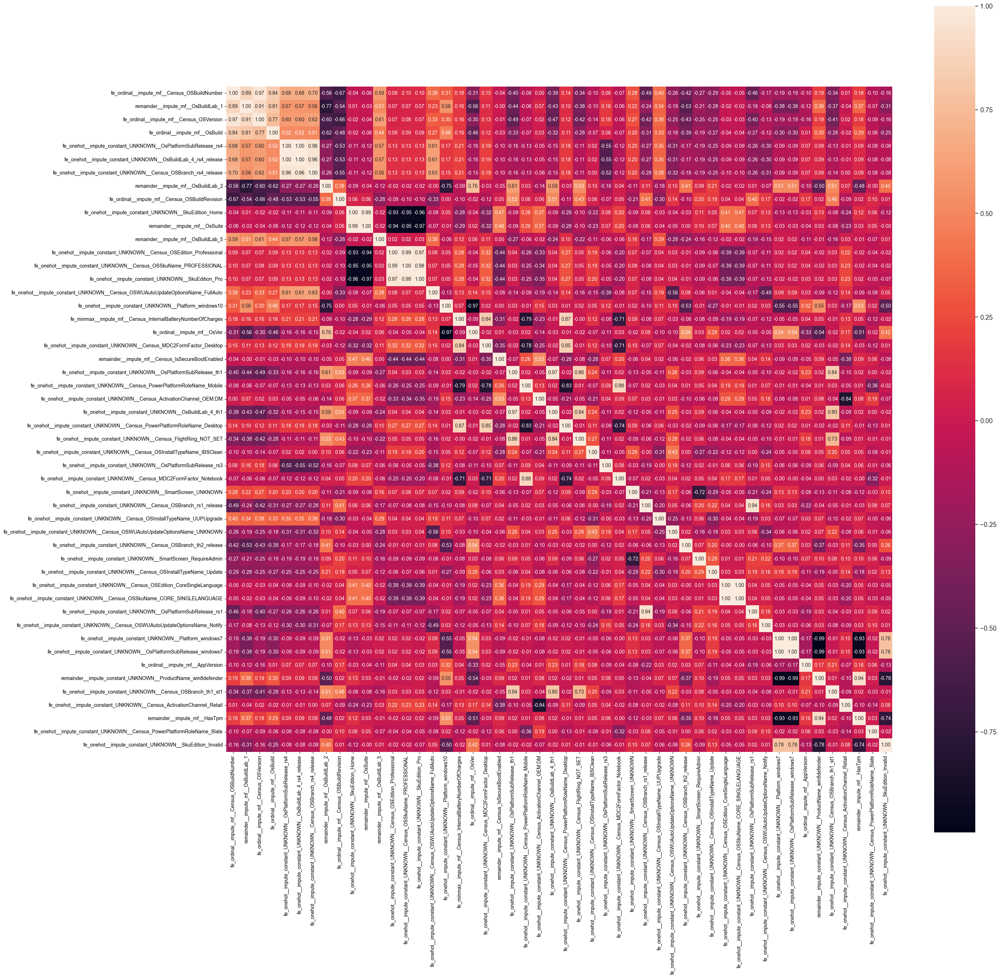

In [36]:
corr = Xt.corr().abs()
f, ax = plt.subplots(figsize=(30, 30))
mean_corr = corr.mean()
cols = mean_corr.nlargest(50).index
cm = np.corrcoef(Xt[cols].values.T)
sns.set(font_scale=1.2)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10},yticklabels=cols, xticklabels=cols)
plt.show()

In [37]:
# Crea un database con las variables con una correlacion mayor a 0.9 o menor de -0.9. De forma que las columnas sean variable1, variable2 y correlacion

highly_correlated_pairs = []

for i in range(len(corr.columns)):
  for j in range(i + 1, len(corr.columns)):
    if abs(corr.iloc[i, j]) > 0.9:
      pair = {
          'variable1': corr.columns[i],
          'variable2': corr.columns[j],
          'correlacion': corr.iloc[i, j]
      }
      highly_correlated_pairs.append(pair)

df_corr = pd.DataFrame(highly_correlated_pairs)
df_corr


,variable1,variable2,correlacion
0,fe_ordinal__impute_mf__EngineVersion,fe_ordinal__impute_mf__AvSigVersion,0.961908
1,fe_ordinal__impute_mf__Census_OSVersion,fe_ordinal__impute_mf__Census_OSBuildNumber,0.969307
2,fe_ordinal__impute_mf__Census_OSVersion,remainder__impute_mf__OsBuildLab_1,0.908804
3,fe_ordinal__impute_mf__OsVer,fe_onehot__impute_constant_UNKNOWN__Platform_w...,0.974218
4,fe_onehot__impute_constant_UNKNOWN__Platform_w...,remainder__impute_constant_UNKNOWN__Census_Dev...,0.998157
5,fe_onehot__impute_constant_UNKNOWN__Platform_w...,fe_onehot__impute_constant_UNKNOWN__OsPlatform...,1.000000
6,fe_onehot__impute_constant_UNKNOWN__Platform_w...,remainder__impute_constant_UNKNOWN__ProductNam...,0.992290
7,fe_onehot__impute_constant_UNKNOWN__Platform_w...,remainder__impute_mf__HasTpm,0.933053
8,fe_onehot__impute_constant_UNKNOWN__Platform_w...,fe_onehot__impute_constant_UNKNOWN__OsPlatform...,1.000000
9,fe_onehot__impute_constant_UNKNOWN__OsPlatform...,fe_onehot__impute_constant_UNKNOWN__Census_OSB...,0.943217


Eliminamos las columnas con alta correlacion para restarle ruido a nuestro modelo:
* fe_ordinal__impute_mf__AvSigVersion
* fe_ordinal__impute_mf__Census_OSBuildNumber
* fe_onehot__impute_constant_UNKNOWN__Platform_windows10
* fe_onehot__impute_constant_UNKNOWN__Platform_windows2016
* fe_onehot__impute_constant_UNKNOWN__Platform_windows7
* fe_onehot__impute_constant_UNKNOWN__OsPlatformSubRelease_windows8.1
* fe_onehot__impute_constant_UNKNOWN__OsPlatformSubRelease_windows7
* fe_onehot__impute_constant_UNKNOWN__Census_OSBranch_rs1_release
* fe_onehot__impute_constant_UNKNOWN__Census_OSBranch_rs2_release
* fe_onehot__impute_constant_UNKNOWN__Census_OSBranch_rs4_release
* fe_onehot__impute_constant_UNKNOWN__SkuEdition_Pro
* fe_onehot__impute_constant_UNKNOWN__Census_OSEdition_Professional
* fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_PROFESSIONAL
* fe_onehot__impute_constant_UNKNOWN__SkuEdition_Home
* fe_onehot__impute_constant_UNKNOWN__Census_ActivationChannel_Retail:TB:Eval
* fe_onehot__impute_constant_UNKNOWN__Census_PowerPlatformRoleName_Slate
* fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_CORE
* fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_CORE_COUNTRYSPECIFIC
* fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_CORE_SINGLELANGUAGE
* remainder__impute_mf__HasTpm
* remainder__impute_constant_UNKNOWN__Census_OSArchitecture_amd64
* remainder__impute_mf__OsBuildLab_3_amd64fre
* todas las columnas generadas de OsBuildLab_4:
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_Other
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs1_release
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs1_release_inmarket
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs2_release
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs3_release
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs3_release_svc_escrow
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs4_release
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_th1
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_th2_release
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_th2_release_sec
  * fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_winblue_ltsb_escrow'

In [38]:
drop_columns = ['fe_ordinal__impute_mf__AvSigVersion',
                'fe_ordinal__impute_mf__Census_OSBuildNumber',
                'fe_onehot__impute_constant_UNKNOWN__Platform_windows10',
                'fe_onehot__impute_constant_UNKNOWN__Platform_windows2016',
                'fe_onehot__impute_constant_UNKNOWN__Platform_windows7',
                'fe_onehot__impute_constant_UNKNOWN__OsPlatformSubRelease_windows8.1',
                'fe_onehot__impute_constant_UNKNOWN__OsPlatformSubRelease_windows7',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSBranch_rs1_release',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSBranch_rs2_release',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSBranch_rs4_release',
                'fe_onehot__impute_constant_UNKNOWN__SkuEdition_Pro',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSEdition_Professional',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_PROFESSIONAL',
                'fe_onehot__impute_constant_UNKNOWN__SkuEdition_Home',
                'fe_onehot__impute_constant_UNKNOWN__Census_ActivationChannel_Retail:TB:Eval',
                'fe_onehot__impute_constant_UNKNOWN__Census_PowerPlatformRoleName_Slate',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_CORE',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_CORE_COUNTRYSPECIFIC',
                'fe_onehot__impute_constant_UNKNOWN__Census_OSSkuName_CORE_SINGLELANGUAGE',
                'remainder__impute_mf__HasTpm',
                'remainder__impute_constant_UNKNOWN__Census_OSArchitecture_amd64',
                'remainder__impute_mf__OsBuildLab_3_amd64fre',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_Other',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs1_release',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs1_release_inmarket',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs2_release',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs3_release',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs3_release_svc_escrow',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_rs4_release',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_th1',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_th2_release',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_th2_release_sec',
                'fe_onehot__impute_constant_UNKNOWN__OsBuildLab_4_winblue_ltsb_escrow']
Xt = Xt.drop(columns = drop_columns)

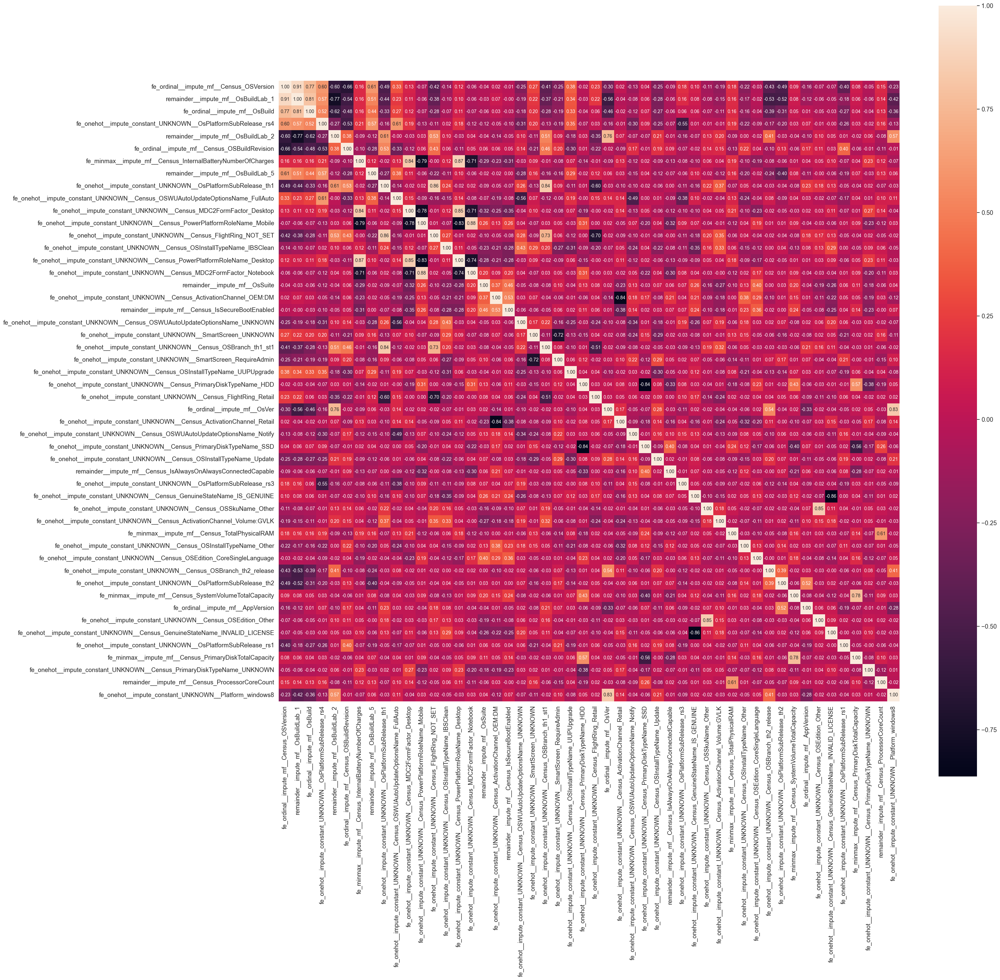

In [39]:
corr = Xt.corr().abs()
f, ax = plt.subplots(figsize=(30, 30))
mean_corr = corr.mean()
cols = mean_corr.nlargest(50).index
cm = np.corrcoef(Xt[cols].values.T)
sns.set(font_scale=1.2)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10},yticklabels=cols, xticklabels=cols)
plt.show()

## Duplicados

Volvemos a comprobar si tenemos duplicados, y eliminamos aquellos que encontremos tanto en Xt como en Yt

In [40]:
Xt.duplicated().sum()

4855

In [41]:
Xt.drop_duplicates(inplace = True)

In [42]:
Yt = Y.drop(index= Y.index.difference(Xt.index))

## Data modeling

Ahora sí, pasamos a preparar el dataset para aplicar el modelo

In [43]:
Xt.shape

(495145, 113)

In [44]:
Yt.shape

(495145,)

### Train/Test split

In [45]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(Xt, Yt, test_size=0.20, random_state=42)

### DecisionTree

In [ ]:
modelo_basico = DecisionTreeClassifier(
        #criterion="gini",
        #splitter="best",
        max_depth=8, #nivel de preguntas
        #min_samples_split=2,
        min_samples_leaf=5000,
        #min_weight_fraction_leaf=0.0,
        #max_features=None,
        random_state=44,
        #max_leaf_nodes=None,
        #min_impurity_decrease=0.0,
        #class_weight=None,
        #ccp_alpha=0.0
)

In [60]:
for i in range(11,21):
  dt_overfit = DecisionTreeClassifier(max_depth = i, min_samples_leaf = 500)
  dt_overfit.fit(X_train, y_train)
  train_acc = dt_overfit.score(X_train, y_train)
  test_acc = dt_overfit.score(X_test, y_test)
  print('Profundidad del arbol es {}, el acc en train es {}, el acc en test es {}. La diferencia es {}'.format(i, np.round(train_acc,4), np.round(test_acc,4),
                                                                                                              (np.round(train_acc,4) - np.round(test_acc,4)).round(4)))

Profundidad del arbol es 11, el acc en train es 0.6302, el acc en test es 0.6299. La diferencia es 0.0003
Profundidad del arbol es 12, el acc en train es 0.6328, el acc en test es 0.6309. La diferencia es 0.0019
Profundidad del arbol es 13, el acc en train es 0.6339, el acc en test es 0.631. La diferencia es 0.0029
Profundidad del arbol es 14, el acc en train es 0.6353, el acc en test es 0.6314. La diferencia es 0.0039
Profundidad del arbol es 15, el acc en train es 0.6358, el acc en test es 0.6313. La diferencia es 0.0045
Profundidad del arbol es 16, el acc en train es 0.6362, el acc en test es 0.6325. La diferencia es 0.0037
Profundidad del arbol es 17, el acc en train es 0.637, el acc en test es 0.6322. La diferencia es 0.0048
Profundidad del arbol es 18, el acc en train es 0.6375, el acc en test es 0.6318. La diferencia es 0.0057
Profundidad del arbol es 19, el acc en train es 0.6378, el acc en test es 0.6315. La diferencia es 0.0063
Profundidad del arbol es 20, el acc en train es 

Profundidad óptima: 16

In [61]:
for i in range(100,1001, 100):
  dt_overfit = DecisionTreeClassifier(max_depth = 16, min_samples_leaf = i)
  dt_overfit.fit(X_train, y_train)
  train_acc = dt_overfit.score(X_train, y_train)
  test_acc = dt_overfit.score(X_test, y_test)
  print('min_samples_split del arbol es {}, el acc en train es {}, el acc en test es {}. La diferencia es {}'.format(i, np.round(train_acc,4), np.round(test_acc,4),
                                                                                               (np.round(train_acc,4) - np.round(test_acc,4)).round(4)))

min_samples_split del arbol es 100, el acc en train es 0.6458, el acc en test es 0.6282. La diferencia es 0.0176
min_samples_split del arbol es 200, el acc en train es 0.6414, el acc en test es 0.6307. La diferencia es 0.0107
min_samples_split del arbol es 300, el acc en train es 0.6387, el acc en test es 0.6317. La diferencia es 0.007
min_samples_split del arbol es 400, el acc en train es 0.6376, el acc en test es 0.6314. La diferencia es 0.0062
min_samples_split del arbol es 500, el acc en train es 0.6362, el acc en test es 0.6325. La diferencia es 0.0037
min_samples_split del arbol es 600, el acc en train es 0.6348, el acc en test es 0.6325. La diferencia es 0.0023
min_samples_split del arbol es 700, el acc en train es 0.6341, el acc en test es 0.6316. La diferencia es 0.0025
min_samples_split del arbol es 800, el acc en train es 0.6337, el acc en test es 0.6314. La diferencia es 0.0023
min_samples_split del arbol es 900, el acc en train es 0.6331, el acc en test es 0.6315. La difer

min_samples_leaf óptima: 600

### RandomForest

Procedemos con un RandomForest manteniendo min_samples_leaf=600

Utilizando un número de estimadores bajo para no demorar el proceso

In [70]:
for i in range(16,25):
  rf_overfit = RandomForestClassifier(n_estimators= 50, max_depth= i, min_samples_leaf=600)
  rf_overfit.fit(X_train, np.ravel(y_train))
  train_acc = rf_overfit.score(X_train, y_train)
  test_acc = rf_overfit.score(X_test, y_test)
  print('Profundidad del arbol es {}, el acc en train es {}, el acc en test es {}. La diferencia es {}'.format(i/100, np.round(train_acc,4), np.round(test_acc,4),
                                                                                    (np.round(train_acc,4) - np.round(test_acc,4)).round(4)))

Profundidad del arbol es 0.16, el acc en train es 0.6333, el acc en test es 0.6325. La diferencia es 0.0008
Profundidad del arbol es 0.17, el acc en train es 0.6329, el acc en test es 0.6327. La diferencia es 0.0002
Profundidad del arbol es 0.18, el acc en train es 0.6342, el acc en test es 0.6332. La diferencia es 0.001
Profundidad del arbol es 0.19, el acc en train es 0.6344, el acc en test es 0.6332. La diferencia es 0.0012
Profundidad del arbol es 0.2, el acc en train es 0.6344, el acc en test es 0.6337. La diferencia es 0.0007
Profundidad del arbol es 0.21, el acc en train es 0.6339, el acc en test es 0.6329. La diferencia es 0.001
Profundidad del arbol es 0.22, el acc en train es 0.6343, el acc en test es 0.6327. La diferencia es 0.0016
Profundidad del arbol es 0.23, el acc en train es 0.634, el acc en test es 0.6334. La diferencia es 0.0006
Profundidad del arbol es 0.24, el acc en train es 0.6345, el acc en test es 0.6336. La diferencia es 0.0009


Profundidad óptima: 20

Una vez tenemos la profundidad utilizaremos GridSearchCV para encontrar el número de estimadores óptimo

In [71]:
parameters = {
    'n_estimators': [50, 100, 250, 500]
}

model_rf = RandomForestClassifier(**parameters, max_depth= 20, min_samples_leaf=600)
grid_search_model_rf = GridSearchCV(
    model_rf, 
    parameters,
    scoring='roc_auc',
    )
grid_search_model_rf.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestClassifier(max_depth=20,
                                              min_samples_leaf=600,
                                              n_estimators=[50, 100, 250, 500]),
             param_grid={'n_estimators': [50, 100, 250, 500]},
             scoring='roc_auc')

In [73]:
grid_search_model_rf.best_params_

{'n_estimators': 500}

Número de estimadores óptimo: 500

### XGBoost

Utilizaremos módelos que proporcionan mayor compatibilidad con el procesamiento en GPU para utilizar GridSearchCV con el fin de encontrar los parámetros adecuados

In [46]:
parameters = {
    'max_depth': [6, 7, 8],
    'n_estimators': [500, 750, 1000],
    'learning_rate': [0.1, 0.2, 0.3]
}

model_xgb = xgb.XGBClassifier(**parameters, device='cuda')
grid_search_model_xgb = GridSearchCV(
    model_xgb, 
    parameters,
    scoring='roc_auc', # estrategia de evaluacion
    verbose=1 # controla los mensajes por pantalla
    )
grid_search_model_xgb.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


c:\Users\Xesco\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\core.py:158: UserWarning: [11:46:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\common\error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device='cuda',
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=[0.1, 0.2...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=[6, 7, 8],
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None,
                                     n_estimators=[500, 750, 1000], n_jobs=None,
                                     num_parallel_tree=None, random_state=None, ...),
             param_grid={'learning_rate': [0.1, 0.2, 0.3],
                         'max_depth': [6, 7, 8],
                         'n_estimators': [500, 750, 1000]},
             scoring='roc_auc', verbose=1)

In [47]:
grid_search_model_xgb.best_params_

{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 500}

Parámetros óptimos:  
* learning_rate: 0.1
* max_depth: 6
* n_estimators: 500

### LGB

Para poder utilizar LGBMClassifier es necesario sanear el nombre de las variables

In [109]:
import re

def sanitize_column_name(name):
    return re.sub(r'[^a-zA-Z0-9_]', '_', name)


X_train = X_train.rename(columns=sanitize_column_name)
X_test = X_test.rename(columns=sanitize_column_name)

In [31]:
parameters = {
    'max_depth': [8, 9, 10, 11, 12],
    'min_child_samples': [100, 500, 1000],
    'min_data_per_group': [100, 500, 1000]

}

model_lgb = lgb.LGBMClassifier(learning_rate = 0.3, n_estimators=1000, device='gpu')
grid_search_model_lgb = GridSearchCV(
    model_lgb, 
    parameters,
    scoring='roc_auc', # estrategia de evaluacion
    )
grid_search_model_lgb.fit(X_train, y_train)

Fitting 5 folds for each of 45 candidates, totalling 225 fits
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

GridSearchCV(estimator=LGBMClassifier(device='gpu', learning_rate=0.3,
                                      n_estimators=1000, verbose=0),
             param_grid={'max_depth': [8, 9, 10, 11, 12],
                         'min_child_samples': [100, 500, 1000],
                         'min_data_per_group': [100, 500, 1000]},
             scoring='roc_auc', verbose=1)

Los warning nos indica que en un momento dado del proceso de entrenamiento, el modelo no encontró ninguna división (split) adicional en el árbol que produzca una ganancia. Puede suceder por la elección de parámetros descompensados, produciendo que el módelo no pueda realizar más divisiones útiles que mejoren en términos de ganancia.  
No es necesariamente un error, pero puede implicar que el módelo ha alcanzado su capacidad de mejora con la configuración actual.

In [32]:
grid_search_model_lgb.best_params_

{'max_depth': 8, 'min_child_samples': 1000, 'min_data_per_group': 500}

Al obtener los parámetros podemos apreciar que nos señala la mínima profundidad y el máximo min_child_samples de los rangos que le hemos proporcionado. Por tanto, procedemos a realizar otro estudio de estos dos parámetros.

In [39]:
parameters = {
    'max_depth': [6, 7, 8],
    'min_child_samples': [1000, 2000, 3000]
}

model_lgb = lgb.LGBMClassifier(learning_rate = 0.3, n_estimators=1000, min_data_per_group=500, device='gpu')
grid_search_model_lgb = GridSearchCV(
    model_lgb, 
    parameters,
    scoring='roc_auc', # estrategia de evaluacion
    )
grid_search_model_lgb.fit(X_train, y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

GridSearchCV(estimator=LGBMClassifier(device='gpu', learning_rate=0.3,
                                      min_data_per_group=500,
                                      n_estimators=1000),
             param_grid={'max_depth': [6, 7, 8],
                         'min_child_samples': [1000, 2000, 3000]},
             scoring='roc_auc', verbose=1)

In [40]:
grid_search_model_lgb.best_params_

{'max_depth': 6, 'min_child_samples': 3000}

Parámetros óptimos:  
* learning_rate: 0.3
* max_depth: 6
* n_estimators: 1000
* min_child_samples: 3000
* min_data_per_group: 500

## Model evaluation

Comprobamos la eficiencia de los modelos utilizados.  
Teniendo en cuenta que lo más importante para nuestro modelo es el True Positive Rate, ya que es más importante que nuestro modelo acierte cuando hay un malware en el dispositivo que cuando no lo hay.  
Por ello, le damos mayor importancia a la precisión (TP / (TP + FP)) y al ROC AUC.

### DecisionTree

In [80]:
model_dt = DecisionTreeClassifier(max_depth = 16, min_samples_leaf = 600)
model_dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=16, min_samples_leaf=600)

In [81]:
model_dt.score(X_test, y_test)

0.6324914923911178

#### F1 Score

In [82]:
metrics.f1_score(y_test, model_dt.predict(X_test))

0.6234376293353199

### ROC AUC

In [83]:
y_score_dt = pd.DataFrame(model_dt.predict_proba(X_test)[:,1], index = y_test.index, columns = ['targetScore'])

In [84]:
fpr_dt, tpr_dt, thresholds_dt = metrics.roc_curve(y_test, y_score_dt['targetScore'])

Text(0, 0.5, 'TPR')

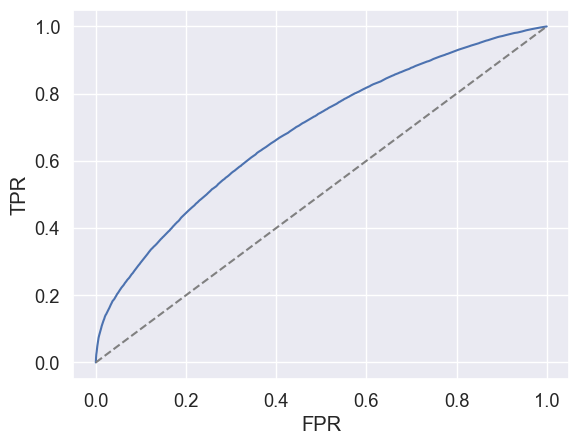

In [85]:
plt.plot(fpr_dt,tpr_dt)
plt.plot([0,1], [0,1], color = 'gray', linestyle = '--')
plt.xlabel('FPR')
plt.ylabel('TPR')

In [86]:
metrics.auc(fpr_dt, tpr_dt)

0.6864493537993508

### RandomForest

In [87]:
model_rm = RandomForestClassifier(n_estimators= 500, max_depth= 16, min_samples_split=600)
model_rm.fit(X_train, np.ravel(y_train))

RandomForestClassifier(max_depth=16, min_samples_split=600, n_estimators=500)

In [88]:
model_rm.score(X_test, y_test)

0.638853265205142

#### F1 Score

In [89]:
metrics.f1_score(y_test, model_rm.predict(X_test))

0.6303920960707716

#### ROC AUC

In [90]:
y_score_rm = pd.DataFrame(model_rm.predict_proba(X_test)[:,1], index = y_test.index, columns = ['targetScore'])

In [91]:
fpr_rm, tpr_rm, thresholds_rm = metrics.roc_curve(y_test, y_score_rm['targetScore'])

Text(0, 0.5, 'TPR')

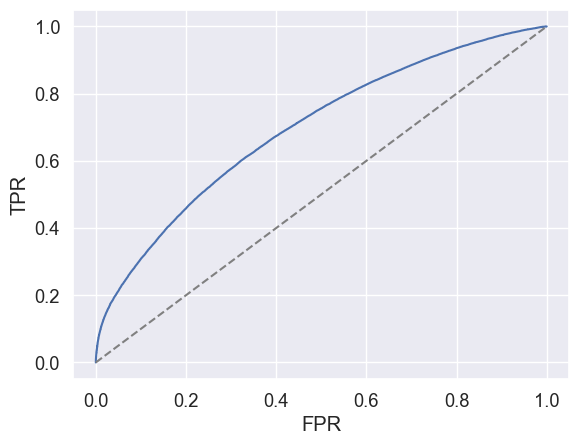

In [92]:
plt.plot(fpr_rm,tpr_rm)
plt.plot([0,1], [0,1], color = 'gray', linestyle = '--')
plt.xlabel('FPR')
plt.ylabel('TPR')

In [93]:
metrics.auc(fpr_rm, tpr_rm)

0.6954194278239423

### XGBoost

In [102]:
model_xgb = xgb.XGBClassifier(max_depth = 6, learning_rate = 0.1, n_estimators=500)

model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [103]:
model_xgb.score(X_test, y_test)

0.6473659231134314

#### F1 Score

In [104]:
metrics.f1_score(y_test, model_xgb.predict(X_test))

0.6396739410823918

#### ROC AUC

In [105]:
y_score_xgb = pd.DataFrame(model_xgb.predict_proba(X_test)[:,1], index = y_test.index, columns = ['targetScore'])

In [106]:
fpr_xgb, tpr_xgb, thresholds_xgb = metrics.roc_curve(y_test, y_score_xgb['targetScore'])

Text(0, 0.5, 'TPR')

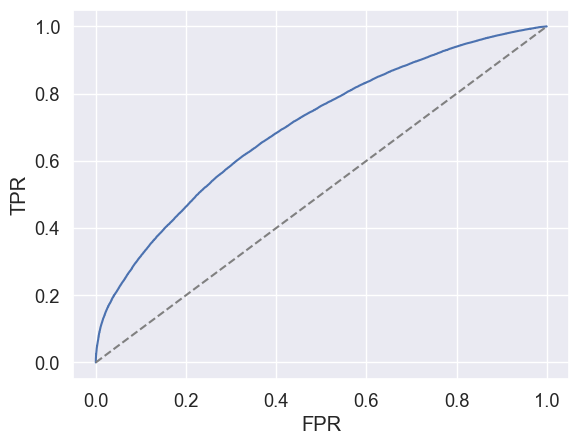

In [99]:
plt.plot(fpr_xgb,tpr_xgb)
plt.plot([0,1], [0,1], color = 'gray', linestyle = '--')
plt.xlabel('FPR')
plt.ylabel('TPR')

In [107]:
metrics.auc(fpr_xgb, tpr_xgb)

0.7069457419413051

### LGB

In [110]:
model_lgb = lgb.LGBMClassifier(learning_rate = 0.3, n_estimators=1000, max_depth=6, min_child_samples=3000, min_data_per_group=500, device='gpu')
model_lgb.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 197917, number of negative: 198199
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 1895
[LightGBM] [Info] Number of data points in the train set: 396116, number of used features: 88
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3060 Ti, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 24 dense feature groups (9.07 MB) transferred to GPU in 0.011897 secs. 1 sparse feature groups
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499644 -> initscore=-0.001424
[LightGBM] [Info] Start training from score -0.001424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further split

LGBMClassifier(device='gpu', learning_rate=0.3, max_depth=6,
               min_child_samples=3000, min_data_per_group=500,
               n_estimators=1000)

In [111]:
model_lgb.score(X_test, y_test)

0.6446697432065355

#### F1 Score

In [112]:
metrics.f1_score(y_test, model_lgb.predict(X_test))

0.6367202824637113

#### ROC AUC

In [113]:
y_score_lgb = pd.DataFrame(model_lgb.predict_proba(X_test)[:,1], index = y_test.index, columns = ['targetScore'])

In [114]:
fpr_lgb, tpr_lgb, thresholds_lgb = metrics.roc_curve(y_test, y_score_lgb['targetScore'])

Text(0, 0.5, 'TPR')

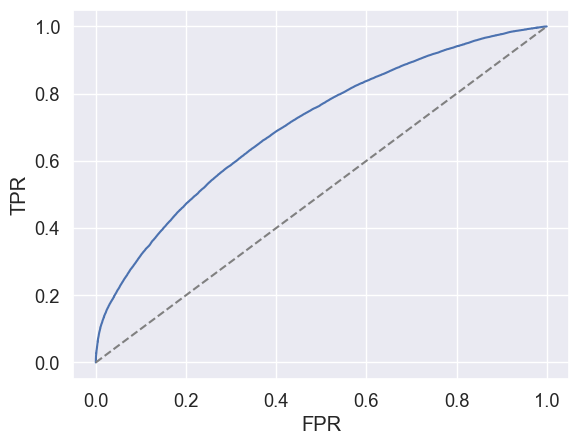

In [115]:
plt.plot(fpr_lgb,tpr_lgb)
plt.plot([0,1], [0,1], color = 'gray', linestyle = '--')
plt.xlabel('FPR')
plt.ylabel('TPR')

In [116]:
metrics.auc(fpr_lgb, tpr_lgb)

0.7046013461298539

## Features importances

Revisamos las features importances para detectar cuales son las variables que tienen mayor impacto en las predicciones del modelo.

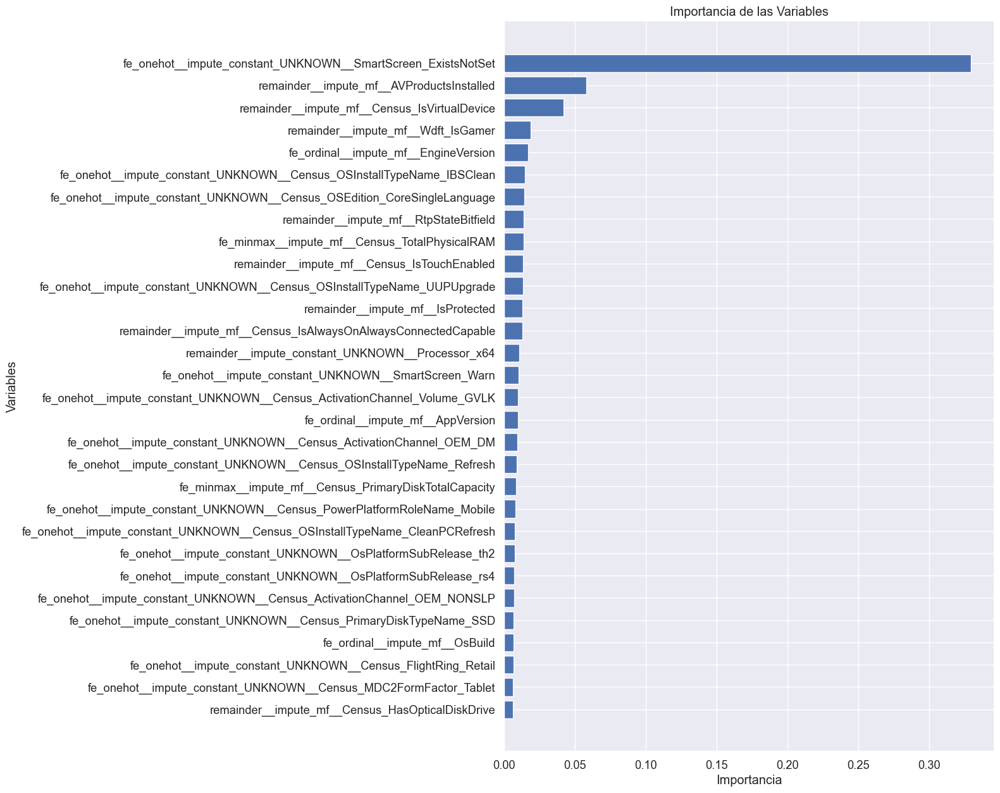

In [133]:
#Muestra las variables de mayor importancia para el modelo con feature_importances_ , quitando del grafico aquellas con minima relevancia
importances = model_xgb.feature_importances_
indices = np.argsort(importances)

# Seleccionamos las variables más importantes
num_features = 30
top_indices = indices[-num_features:]

plt.figure(figsize=(10, 15))
plt.barh(range(num_features), importances[top_indices], align='center')
plt.yticks(range(num_features), X_train.columns[top_indices])
plt.xlabel('Importancia')
plt.ylabel('Variables')
plt.title('Importancia de las Variables')
plt.show()


### SmartScreen

In [175]:
Xfi = Xt.copy()
Xfi['HasDetection'] = Yt
Xfi.info()

<class 'pandas.core.frame.DataFrame'>
Index: 495145 entries, f1cd864e97bae82bdf96523e1a539121 to 7b45dc3537e17f16305c5983ca0a1cb9
Columns: 114 entries, fe_ordinal__impute_mf__EngineVersion to HasDetection
dtypes: float64(88), int32(4), int64(22)
memory usage: 443.0+ MB


### SmartScreen_ExistsNotSet

Variable que nos indica que SmartScreen esta deshabilitado, como nos indican en kaggle:  If the value exists but is blank, the value "ExistsNotSet" is sent in telemetry.  
  
SmartScreen de Microsoft Defender protege frente a malware de sitios web y aplicaciones de suplantación de identidad, y la descarga de archivos potencialmente maliciosos.
SmartScreen de Microsoft Defender determina si un sitio es potencialmente malicioso o si una aplicación descargada o instalador de aplicación es potencialmente malintencionado.

<Axes: xlabel='fe_onehot__impute_constant_UNKNOWN__SmartScreen_ExistsNotSet', ylabel='HasDetection'>

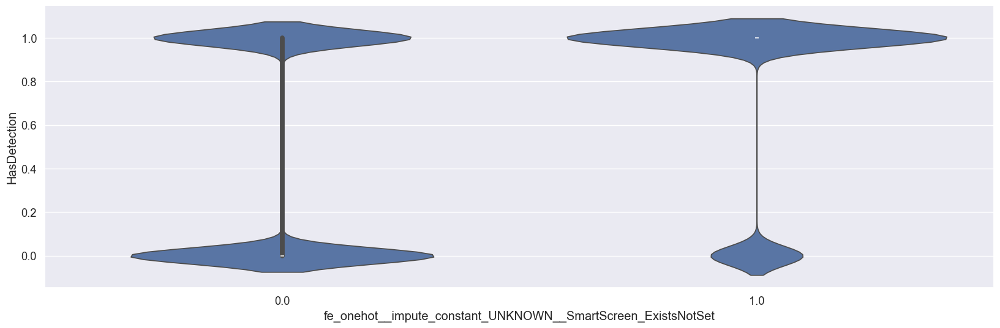

In [189]:
plt.figure(figsize=(20, 6))
sns.violinplot(x=Xfi.columns[top_indices[-1]], y="HasDetection", data=Xfi)

Se observa un aumento de casos de detección de malware cuando la variable es positiva.

### AVProductsInstalled

Aunque en kaggle no se especifica la definición de este campo deducimos que se trata de la cantidad de productos del antivirus instalados.  

<Axes: xlabel='remainder__impute_mf__AVProductsInstalled', ylabel='HasDetection'>

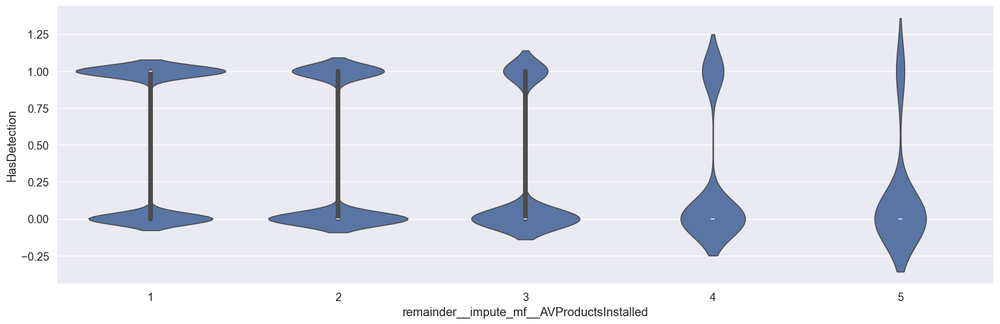

In [187]:
plt.figure(figsize=(20, 6))
sns.violinplot(x=Xfi.columns[top_indices[-2]], y="HasDetection", data=Xfi)

Con el aumento del valor de la variable disminuyen los casos de malware en los dispositivos.  
A mayor número de productos de antivirus instalados en el sistema menos probable encontrar malware.

### Census_IsVirtualDevice

Identifica si hay una máquina virtual activa.

<Axes: xlabel='remainder__impute_mf__Census_IsVirtualDevice', ylabel='HasDetection'>

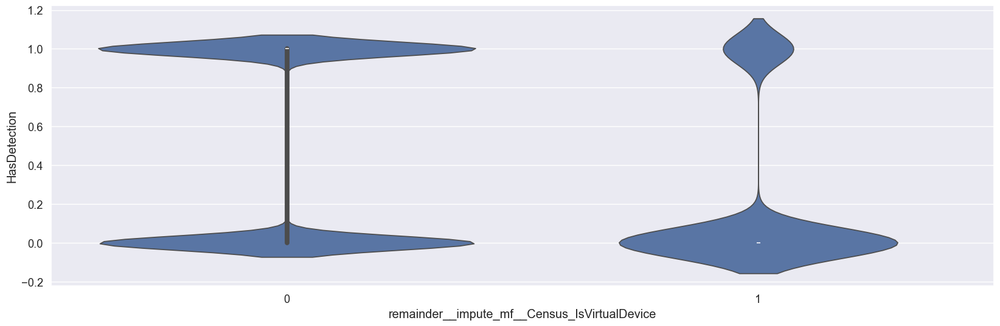

In [188]:
plt.figure(figsize=(20, 6))
sns.violinplot(x=Xfi.columns[top_indices[-3]], y="HasDetection", data=Xfi)

Si la máquina virtual está activa se detectan menos casos de malware.

## Prueba con modelo simplificado

In [134]:
X_train.columns[top_indices]

Index(['remainder__impute_mf__Census_HasOpticalDiskDrive',
       'fe_onehot__impute_constant_UNKNOWN__Census_MDC2FormFactor_Tablet',
       'fe_onehot__impute_constant_UNKNOWN__Census_FlightRing_Retail',
       'fe_ordinal__impute_mf__OsBuild',
       'fe_onehot__impute_constant_UNKNOWN__Census_PrimaryDiskTypeName_SSD',
       'fe_onehot__impute_constant_UNKNOWN__Census_ActivationChannel_OEM_NONSLP',
       'fe_onehot__impute_constant_UNKNOWN__OsPlatformSubRelease_rs4',
       'fe_onehot__impute_constant_UNKNOWN__OsPlatformSubRelease_th2',
       'fe_onehot__impute_constant_UNKNOWN__Census_OSInstallTypeName_CleanPCRefresh',
       'fe_onehot__impute_constant_UNKNOWN__Census_PowerPlatformRoleName_Mobile',
       'fe_minmax__impute_mf__Census_PrimaryDiskTotalCapacity',
       'fe_onehot__impute_constant_UNKNOWN__Census_OSInstallTypeName_Refresh',
       'fe_onehot__impute_constant_UNKNOWN__Census_ActivationChannel_OEM_DM',
       'fe_ordinal__impute_mf__AppVersion',
       'fe_onehot__i

In [135]:
X_train_t = X_train[X_train.columns[top_indices]]

In [136]:
X_test_t = X_test[X_test.columns[top_indices]]

In [137]:
parameters = {
    'max_depth': [5, 6, 7],
    'n_estimators': [100, 250, 500]
}

model_s = xgb.XGBClassifier(**parameters, learning_rate = 0.1,device='cuda')
grid_search_model_s = GridSearchCV(
    model_s, 
    parameters,
    scoring='roc_auc'
    )
grid_search_model_s.fit(X_train, y_train)

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device='cuda',
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_...None,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=[5, 6, 7],
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None,
                                     n_estimators=[100, 250, 500], n_jobs=None,
                                     num_parallel_tree=None, random_state=None, ...),
             param_grid={'max_depth': [5, 6, 7],
                         'n_estimators': [100, 250, 500]},
             scoring='roc_auc')

In [139]:
grid_search_model_xgb.best_params_

{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 500}

In [143]:
modelo_s_xgb = xgb.XGBClassifier(max_depth = 6, learning_rate = 0.1, n_estimators=500)
modelo_s_xgb.fit(X_train_t, np.ravel(y_train))

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [144]:
modelo_s_xgb.score(X_test_t, y_test)

0.6381161074028819

In [145]:
metrics.f1_score(y_test, modelo_s_xgb.predict(X_test_t))

0.630976285358294

In [146]:
y_score_t = pd.DataFrame(modelo_s_xgb.predict_proba(X_test_t)[:,1], index = y_test.index, columns = ['targetScore'])

In [147]:
fpr_t, tpr_t, thresholds_t = metrics.roc_curve(y_test, y_score_t['targetScore'])

Text(0, 0.5, 'TPR')

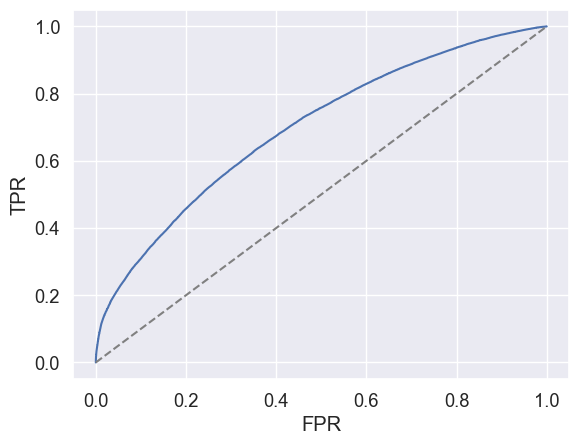

In [148]:
plt.plot(fpr_t,tpr_t)
plt.plot([0,1], [0,1], color = 'gray', linestyle = '--')
plt.xlabel('FPR')
plt.ylabel('TPR')

In [149]:
metrics.auc(fpr_t, tpr_t)

0.6969642128173545

Al simplificar el modelo hemos perdido capacidad predictiva.  
Reduciendo las variables puede que estemos eliminando características que tienen información importante para el modelo. Algunas pueden parecer menos significativas por sí solas pero en combinación con otras pueden proporcionar información relevante.

## Conclusiones

Despues de analizar los diferentes modelos, el XGBClassifier presenta mejores métricas que el resto.   
Al tratarse de un modelo más simple en comparación a los parámetros utilizados con LGBMClassifier pensamos que generalizará mejor.

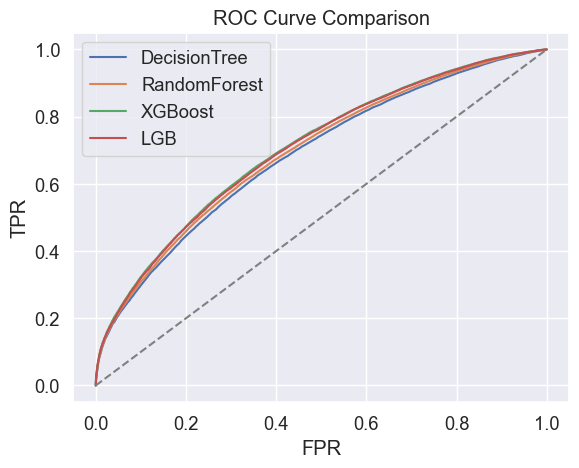

In [165]:
# Plot ROC curves
plt.plot(fpr_dt, tpr_dt, label='DecisionTree')
plt.plot(fpr_rm, tpr_rm, label='RandomForest')
plt.plot(fpr_xgb, tpr_xgb, label='XGBoost')
plt.plot(fpr_lgb, tpr_lgb, label='LGB')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve Comparison')
plt.legend()
plt.show()

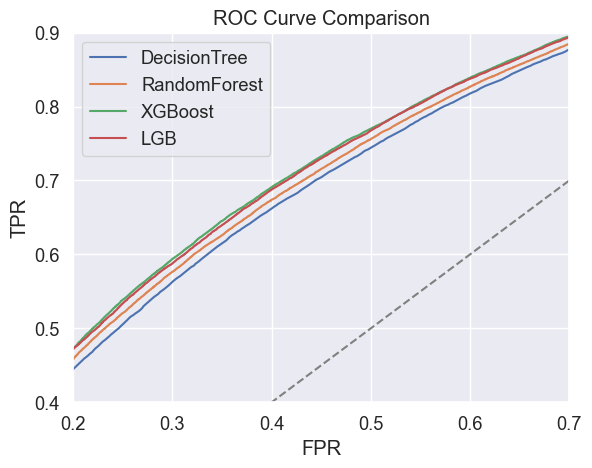

In [164]:
# Plot ROC curves
plt.plot(fpr_dt, tpr_dt, label='DecisionTree')
plt.plot(fpr_rm, tpr_rm, label='RandomForest')
plt.plot(fpr_xgb, tpr_xgb, label='XGBoost')
plt.plot(fpr_lgb, tpr_lgb, label='LGB')

plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve Comparison')
plt.xlim([0.2, 0.7]) 
plt.ylim([0.4, 0.9])  
plt.legend()
plt.show()

Comparando las curvas ROC y el valor AUC como resumen del rendimiento de los modelos, observamos que aunque por poca diferencia la curva del XGBClassifier está más a la izquierda de la linea RandomClassifier con lo que es mejor clasificador ya que mejora su tasa de verdaderos positivos minimizando también la tasa de falsos positivos.

### Modelo final

In [166]:
model_xgb = xgb.XGBClassifier(max_depth = 6, learning_rate = 0.1, n_estimators=500)

model_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [167]:
model_xgb.score(X_test, y_test)

0.6473659231134314

### F1 Score

In [168]:
metrics.f1_score(y_test, model_xgb.predict(X_test))

0.6396739410823918

### ROC AUC

In [170]:
y_score_xgb = pd.DataFrame(model_xgb.predict_proba(X_test)[:,1], index = y_test.index, columns = ['targetScore'])
fpr_xgb, tpr_xgb, thresholds_xgb = metrics.roc_curve(y_test, y_score_xgb['targetScore'])

Text(0, 0.5, 'TPR')

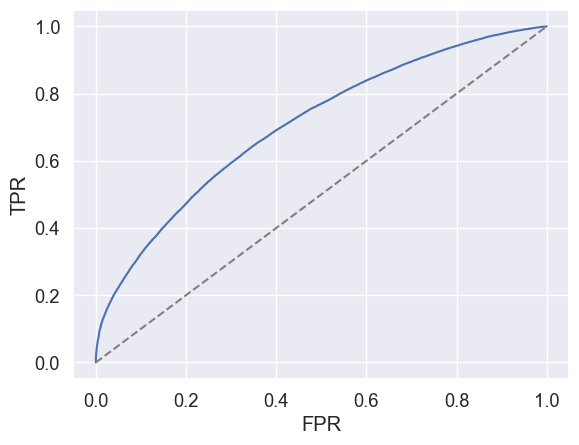

In [171]:
plt.plot(fpr_xgb,tpr_xgb)
plt.plot([0,1], [0,1], color = 'gray', linestyle = '--')
plt.xlabel('FPR')
plt.ylabel('TPR')

In [172]:
metrics.auc(fpr_xgb, tpr_xgb)

0.7069457419413051